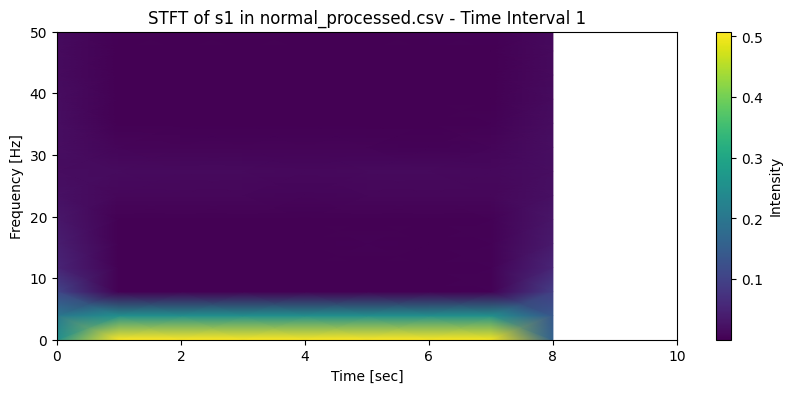

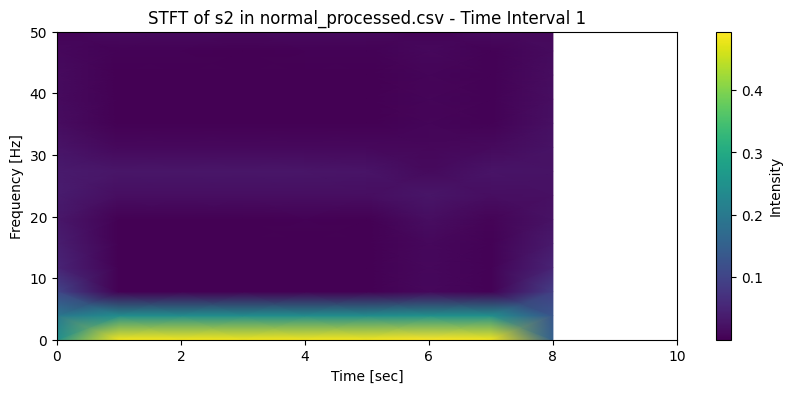

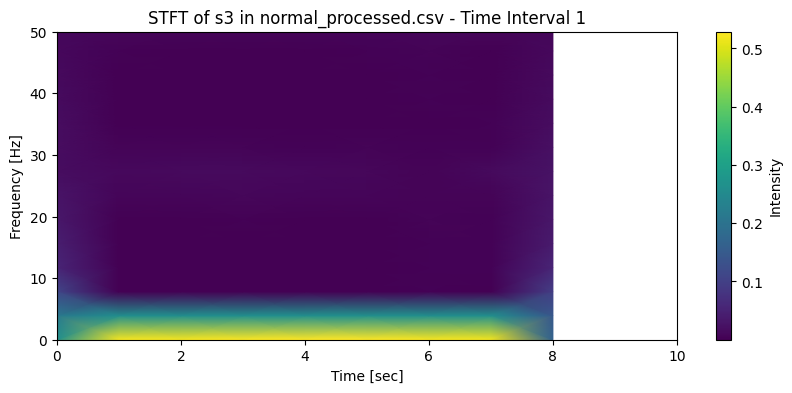

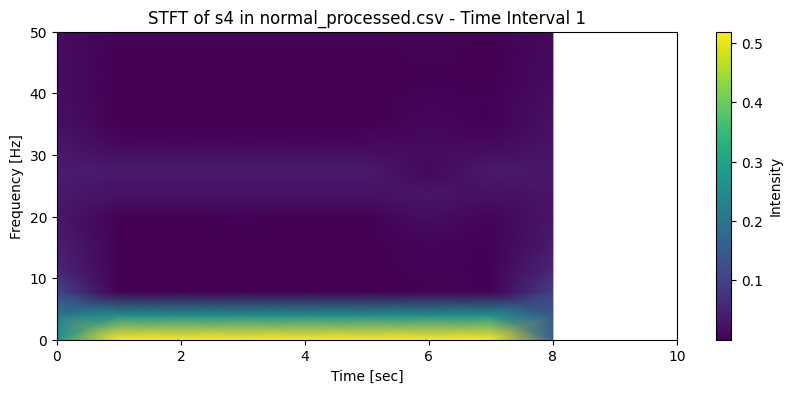

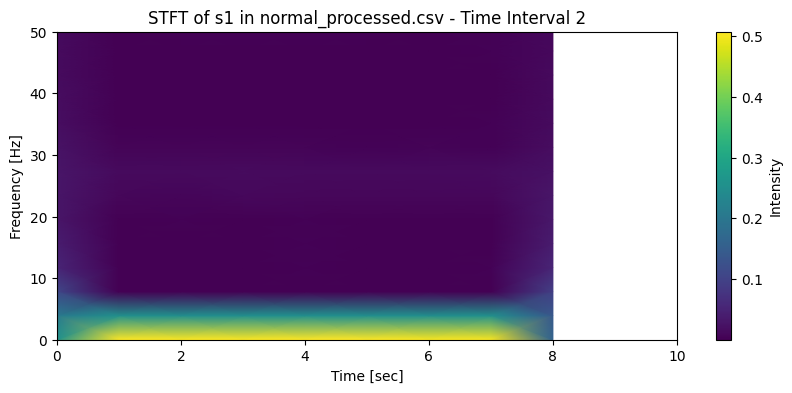

...

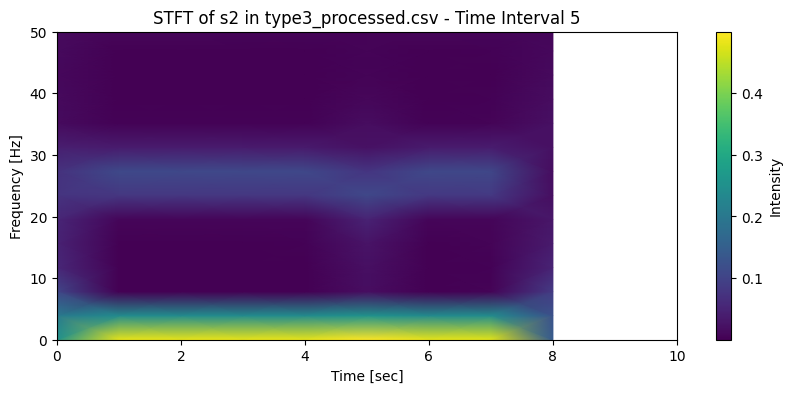

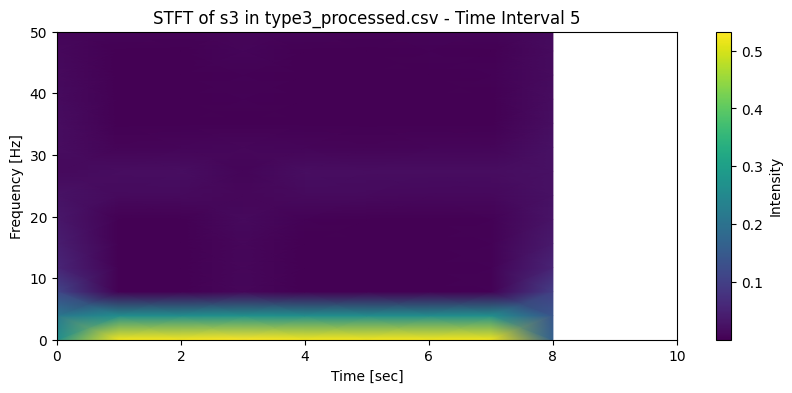

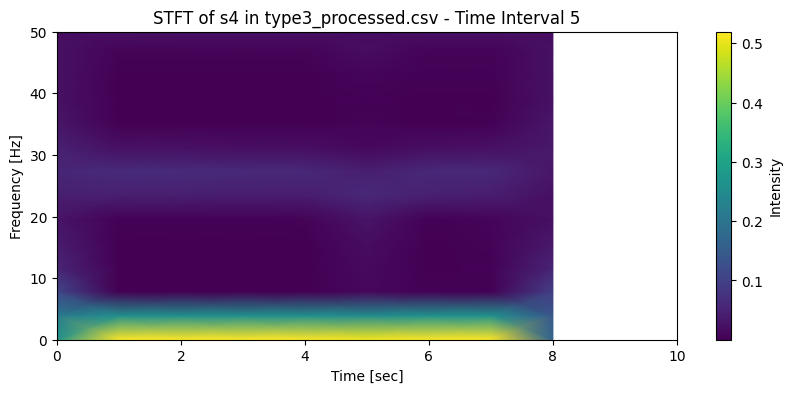

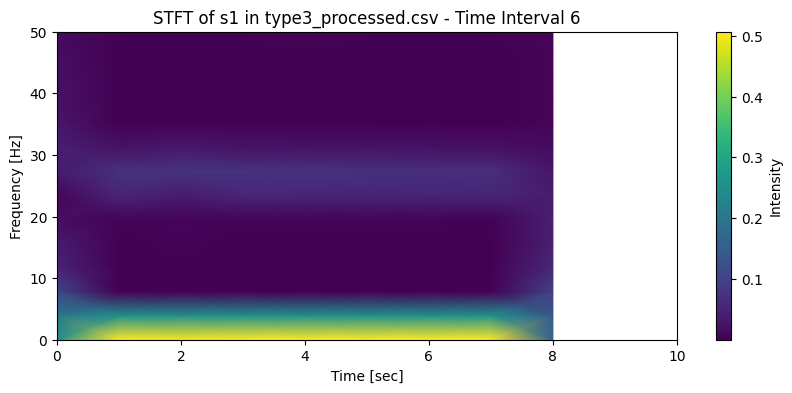

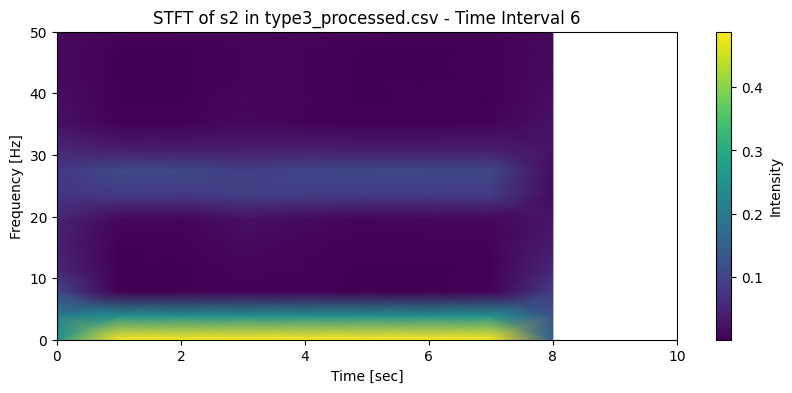

KeyboardInterrupt: 

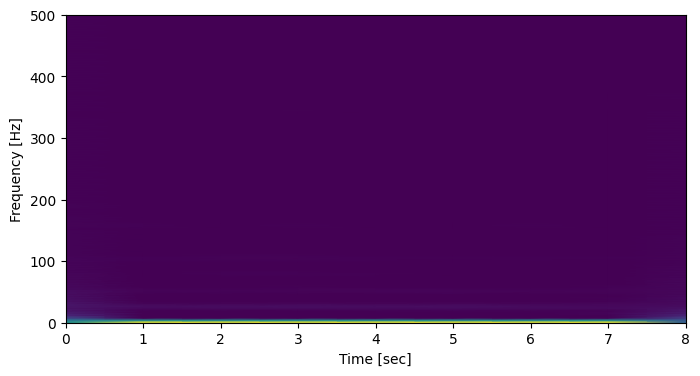

In [1]:
import os
import numpy as np
import pandas as pd
from scipy.signal import stft
import matplotlib.pyplot as plt

# 각 파일을 시간별로 나누고 STFT를 수행하여 시각화하는 함수
def process_and_visualize_files(folder_path):
    # 폴더 내의 각 파일에 대해 반복
    for filename in os.listdir(folder_path):
        if filename.endswith('.csv'):
            # CSV 파일 불러오기
            data = pd.read_csv(os.path.join(folder_path, filename))
            
            # 데이터의 시간 구간 계산 (간격은 1초라고 가정)
            num_time_intervals = 140000 // 10000  # 총 140초 (1초 간격)
            
            # 각 시간 구간에 대해 반복
            for i in range(num_time_intervals):
                # 시간 구간을 정의
                start_index = i * 1000
                end_index = (i + 1) * 1000
                
                # 시간 구간에 해당하는 데이터 추출
                data_segment = data.iloc[start_index:end_index, :]
                
                # 각 센서에 대해 STFT 수행 및 시각화
                for column in data_segment.columns:
                    # STFT 변환
                    _, _, Zxx = stft(data_segment[column], fs=1000, nperseg=256, noverlap=128)
                    
                    # 시각화
                    plt.figure(figsize=(10, 4))
                    plt.pcolormesh(np.arange(Zxx.shape[1]), np.fft.rfftfreq(256, 1/1000), np.abs(Zxx), shading='gouraud')
                    plt.ylabel('Frequency [Hz]')
                    plt.xlabel('Time [sec]')
                    plt.colorbar(label='Intensity')
                    plt.title(f'STFT of {column} in {filename} - Time Interval {i+1}')
                    
                    # X 축을 100초로 설정
                    plt.xlim(0, 8)
                    
                    # Y 축을 0에서 50Hz로 설정
                    plt.ylim(0, 50)
                    
                    plt.show()

# 데이터 파일이 저장된 폴더 경로 설정
folder_path = 'C:/Users/7-2009-1186-16/Desktop/rotordata/data/modified'

# 함수 호출하여 처리 및 시각화 실행
process_and_visualize_files(folder_path)


In [1]:
cd C:/Users/7-2009-1186-16/Desktop/rotordata/data/modified

C:\Users\7-2009-1186-16\Desktop\rotordata\data\modified


In [5]:
import pandas as pd
import numpy as np
import pywt
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

# 1. 데이터 불러오기
normal_data = pd.read_csv("normal_processed.csv")
abnormal1_data = pd.read_csv("type1_processed.csv")
abnormal2_data = pd.read_csv("type2_processed.csv")
abnormal3_data = pd.read_csv("type3_processed.csv")

# 2. CWT 적용
def apply_cwt(data):
    coefficients_list = []
    for i in range(data.shape[1]):
        sensor_data = data.iloc[:, i].values
        coefficients, frequencies = pywt.cwt(sensor_data, scales=range(1, 128), wavelet='morl')
        coefficients_list.append(coefficients)
    return np.concatenate(coefficients_list, axis=1)

normal_features = apply_cwt(normal_data)
abnormal1_features = apply_cwt(abnormal1_data)
abnormal2_features = apply_cwt(abnormal2_data)
abnormal3_features = apply_cwt(abnormal3_data)

# 3. 데이터 레이블링
normal_labels = np.zeros(normal_features.shape[0])  # 정상 데이터의 레이블은 0
abnormal1_labels = np.ones(abnormal1_features.shape[0])  # 이상1 데이터의 레이블은 1
abnormal2_labels = np.full(abnormal2_features.shape[0], 2)  # 이상2 데이터의 레이블은 2
abnormal3_labels = np.full(abnormal3_features.shape[0], 3)  # 이상3 데이터의 레이블은 3

# 모든 데이터와 레이블을 하나의 배열로 병합
X = np.concatenate([normal_features, abnormal1_features, abnormal2_features, abnormal3_features])
y = np.concatenate([normal_labels, abnormal1_labels, abnormal2_labels, abnormal3_labels])

# 4. 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 5. 모델 생성 및 훈련
svm_model = SVC()
svm_model.fit(X_train, y_train)

# 6. 모델 평가
y_pred = svm_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9607843137254902


In [5]:
import pandas as pd
import numpy as np
import pywt
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.inspection import permutation_importance

# 1. 데이터 불러오기
normal_data = pd.read_csv("normal_processed.csv")
abnormal1_data = pd.read_csv("type1_processed.csv")
abnormal2_data = pd.read_csv("type2_processed.csv")
abnormal3_data = pd.read_csv("type3_processed.csv")

# 2. 데이터 크기 줄이기 (예: 샘플링)
normal_data = normal_data.sample(frac=0.5, random_state=42)
abnormal1_data = abnormal1_data.sample(frac=0.5, random_state=42)
abnormal2_data = abnormal2_data.sample(frac=0.5, random_state=42)
abnormal3_data = abnormal3_data.sample(frac=0.5, random_state=42)

# 3. CWT 적용
def apply_cwt(data):
    coefficients_list = []
    for i in range(data.shape[1]):
        sensor_data = data.iloc[:, i].values
        coefficients, frequencies = pywt.cwt(sensor_data, scales=range(1, 128), wavelet='morl')
        coefficients_list.append(coefficients)
    return np.concatenate(coefficients_list, axis=1)

normal_features = apply_cwt(normal_data)
abnormal1_features = apply_cwt(abnormal1_data)
abnormal2_features = apply_cwt(abnormal2_data)
abnormal3_features = apply_cwt(abnormal3_data)

# 4. 데이터 레이블링
normal_labels = np.zeros(normal_features.shape[0])  # 정상 데이터의 레이블은 0
abnormal1_labels = np.ones(abnormal1_features.shape[0])  # 이상1 데이터의 레이블은 1
abnormal2_labels = np.full(abnormal2_features.shape[0], 2)  # 이상2 데이터의 레이블은 2
abnormal3_labels = np.full(abnormal3_features.shape[0], 3)  # 이상3 데이터의 레이블은 3

# 모든 데이터와 레이블을 하나의 배열로 병합
X = np.concatenate([normal_features, abnormal1_features, abnormal2_features, abnormal3_features])
y = np.concatenate([normal_labels, abnormal1_labels, abnormal2_labels, abnormal3_labels])

# 5. 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 6. 모델 생성 및 훈련
svm_model = SVC()
svm_model.fit(X_train, y_train)

# 7. 모델 평가
y_pred = svm_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# 8. 특성 중요도 계산
result = permutation_importance(svm_model, X_test, y_test, n_repeats=10, random_state=42, n_jobs=-1)

# 9. 특성 중요도 출력
sorted_idx = result.importances_mean.argsort()
for i in sorted_idx:
    print(f"{i}: {result.importances_mean[i]:.3f} +/- {result.importances_std[i]:.3f}")


Accuracy: 0.9901960784313726


TerminatedWorkerError: A worker process managed by the executor was unexpectedly terminated. This could be caused by a segmentation fault while calling the function or by an excessive memory usage causing the Operating System to kill the worker.


In [14]:
import pandas as pd
import numpy as np
import pywt
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.inspection import permutation_importance
import psutil

# 1. 데이터 불러오기
normal_data = pd.read_csv("normal_processed.csv")
abnormal1_data = pd.read_csv("type1_processed.csv")
abnormal2_data = pd.read_csv("type2_processed.csv")
abnormal3_data = pd.read_csv("type3_processed.csv")

# 2. 데이터 크기 줄이기 (예: 샘플링)
normal_data = normal_data.sample(frac=0.5, random_state=42)
abnormal1_data = abnormal1_data.sample(frac=0.5, random_state=42)
abnormal2_data = abnormal2_data.sample(frac=0.5, random_state=42)
abnormal3_data = abnormal3_data.sample(frac=0.5, random_state=42)

# 3. CWT 적용
def apply_cwt(data):
    coefficients_list = []
    for i in range(4):  # 4개의 센서에 대해 반복
        sensor_data = data[f"s{i+1}"].values  # 센서 데이터 추출
        coefficients, frequencies = pywt.cwt(sensor_data, scales=range(1, 128), wavelet='morl')
        coefficients_list.append(coefficients)
    return np.concatenate(coefficients_list, axis=1)

normal_features = apply_cwt(normal_data)
abnormal1_features = apply_cwt(abnormal1_data)
abnormal2_features = apply_cwt(abnormal2_data)
abnormal3_features = apply_cwt(abnormal3_data)

# 4. 데이터 레이블링
normal_labels = np.zeros(normal_features.shape[0])  # 정상 데이터의 레이블은 0
abnormal1_labels = np.ones(abnormal1_features.shape[0])  # 이상1 데이터의 레이블은 1
abnormal2_labels = np.full(abnormal2_features.shape[0], 2)  # 이상2 데이터의 레이블은 2
abnormal3_labels = np.full(abnormal3_features.shape[0], 3)  # 이상3 데이터의 레이블은 3

# 모든 데이터와 레이블을 하나의 배열로 병합
X = np.concatenate([normal_features, abnormal1_features, abnormal2_features, abnormal3_features])
y = np.concatenate([normal_labels, abnormal1_labels, abnormal2_labels, abnormal3_labels])

# 5. 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

def check_memory_usage():
    mem = psutil.virtual_memory()
    print(f"Memory Usage: {mem.percent}%")

# 6. 모델 생성 및 훈련
print("Before training:")
check_memory_usage()

svm_model = SVC()
svm_model.fit(X_train, y_train)

# 모델 훈련 후 메모리 사용량 확인
print("After training:")
check_memory_usage()

# 7. 모델 평가
print("Before evaluation:")
check_memory_usage()

y_pred = svm_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# 평가 후 메모리 사용량 확인
print("After evaluation:")
check_memory_usage()


Before training:
Memory Usage: 69.2%
After training:
Memory Usage: 72.9%
Before evaluation:
Memory Usage: 72.9%
Accuracy: 0.9901960784313726
After evaluation:
Memory Usage: 73.5%


In [15]:
import pandas as pd
import numpy as np
import pywt
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import shap

# 1. 데이터 불러오기
normal_data = pd.read_csv("normal_processed.csv")
abnormal1_data = pd.read_csv("type1_processed.csv")
abnormal2_data = pd.read_csv("type2_processed.csv")
abnormal3_data = pd.read_csv("type3_processed.csv")

# 2. 데이터 크기 줄이기 (예: 샘플링)
normal_data = normal_data.sample(frac=0.5, random_state=42)
abnormal1_data = abnormal1_data.sample(frac=0.5, random_state=42)
abnormal2_data = abnormal2_data.sample(frac=0.5, random_state=42)
abnormal3_data = abnormal3_data.sample(frac=0.5, random_state=42)

# 3. CWT 적용
def apply_cwt(data):
    coefficients_list = []
    for i in range(4):  # 4개의 센서에 대해 반복
        sensor_data = data[f"s{i+1}"].values  # 센서 데이터 추출
        coefficients, frequencies = pywt.cwt(sensor_data, scales=range(1, 128), wavelet='morl')
        coefficients_list.append(coefficients)
    return np.concatenate(coefficients_list, axis=1)

normal_features = apply_cwt(normal_data)
abnormal1_features = apply_cwt(abnormal1_data)
abnormal2_features = apply_cwt(abnormal2_data)
abnormal3_features = apply_cwt(abnormal3_data)

# 4. 데이터 레이블링
normal_labels = np.zeros(normal_features.shape[0])  # 정상 데이터의 레이블은 0
abnormal1_labels = np.ones(abnormal1_features.shape[0])  # 이상1 데이터의 레이블은 1
abnormal2_labels = np.full(abnormal2_features.shape[0], 2)  # 이상2 데이터의 레이블은 2
abnormal3_labels = np.full(abnormal3_features.shape[0], 3)  # 이상3 데이터의 레이블은 3

# 모든 데이터와 레이블을 하나의 배열로 병합
X = np.concatenate([normal_features, abnormal1_features, abnormal2_features, abnormal3_features])
y = np.concatenate([normal_labels, abnormal1_labels, abnormal2_labels, abnormal3_labels])

# 5. 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 6. 모델 생성 및 훈련
svm_model = SVC()
svm_model.fit(X_train, y_train)

# 7. SHAP을 사용하여 특성 중요도 계산
explainer = shap.Explainer(svm_model, X_train)
shap_values = explainer.shap_values(X_test)

# 8. SHAP 결과 시각화
shap.summary_plot(shap_values, X_test, plot_type="bar")


TypeError: The passed model is not callable and cannot be analyzed directly with the given masker! Model: SVC()